In [26]:
from pathlib import Path
import numpy as np
import pypolo2

# Environment

We will download the image of 30-meter resolution elevation data from the [Shuttle Radar Topography Mission](https://www2.jpl.nasa.gov/srtm/) and use the elevation map as the ground-truth environment.
You can preview the image and choose your favorate tile from the link below.
Note down the tile ID, e.g., N17E073.
PyPolo provides utility function to download and preprocess the data.

https://dwtkns.com/srtm30m/

In [27]:
diffusivity_K = 1 # diffusivity
grid_x = grid_y = 10 # x,y coordinate range
# initial_field_test = 10 * np.ones((grid_x, grid_y)) + np.random.random((grid_x, grid_y))# randomly initialize "initial_field" map matrix around 10
initial_field_test = 10 * np.ones((grid_y, grid_x))
#gpr t dim and dynamic time period
time_co = 0.0001
delta_t = 0.05

R_test = np.zeros((grid_x, grid_y))# initialize pollution resource map matrix
R_test[7][2] = 200 # a pollution resource in [7][2]
R_test[2][7] = 100

model_test = pypolo2.experiments.environments.Diffusion_Model(diffusivity = diffusivity_K, x_range = grid_x, y_range = grid_y,\
                 initial_field = initial_field_test, R_field = R_test) # build model

env = model_test.solve(2)

100%|██████████| 2.0/2.0 [00:00<00:00,  3.74it/s]    


We specify the environment extent and task extent. The robot can move within the environment extent but we only conduct the Robotic Information Gathering task in the task extent. We need to leave some buffer space because the robot is not guaranteed to always stay in the workspace due to [underactuation](https://en.wikipedia.org/wiki/Underactuation) or external disturbances. For example, an Autonomous Surface Vehicle (ASV) cannot turn in-place while moving at a high speed due to inertia and its motion can be disturbed by waves or strong wind.

In [28]:
# [xmin, xmax, ymin, ymax]
env_extent = [0, grid_x, 0, grid_y]
task_extent = [0, grid_x-1, 0, grid_y-1]

# Sensor

In [29]:
sensing_rate = 1.0
noise_scale = 1.0

In [30]:
sensor = pypolo2.sensors.Sprinkler(
    rate=sensing_rate,  # collects 1 sonar measurement per sec
    env=env,  # the sensor samples from this environment
    env_extent=env_extent,  # workspace extent
    noise_scale=noise_scale,  # observational Gaussian noise scale (i.e., standard deviation)
)

# Pilot Survey

In [31]:
seed = 0
num_init_samples = 1
rng = pypolo2.experiments.utilities.seed_everything(seed)


Set random seed to 0 in random, numpy, and torch.


In [32]:
x_init = np.zeros((num_init_samples,2))
x_init[0,0] = 0.0
x_init[0,1] = 0.0

#模拟气象先验
x_station = np.zeros((4,2))
x_station[0,0] = 2.0
x_station[0,1] = 2.0
x_station[1,0] = 7.0
x_station[1,1] = 2.0
x_station[2,0] = 2.0
x_station[2,1] = 7.0
x_station[3,0] = 7.0
x_station[3,1] = 7.0

y_init = np.zeros((num_init_samples,1))
y_stations = np.zeros((4*4,1))
 
time_init = np.zeros((num_init_samples,1))
time_stations = np.zeros((4*4,1))

env_model = pypolo2.experiments.environments.Diffusion_Model(diffusivity = diffusivity_K, x_range = grid_x, y_range = grid_y,\
                 initial_field = env, R_field = R_test) # build model

#固定站的观测的观测
for time in range(4):
    y_stations[4*time:4+4*time] = sensor.sense(states=x_station, rng=rng).reshape(-1, 1)
    time_stations[4*time:4+4*time] = (time-2)*time_co
    env = env_model.solve((time+1)*delta_t)
    sensor.set_env(env)
    
#假设每次观测后均变化时间，环境也随之发生变化
for time in range(num_init_samples):
    y_init[time] = sensor.sense(states=x_init[time], rng=rng).reshape(-1, 1)
    time_init[time] = (time+1)*time_co
    env = env_model.solve((1+4+time)*delta_t)
    sensor.set_env(env)

x_init = np.hstack((x_init,time_init))
# print(x_init)
x_train = x_init

x_stations = np.vstack((x_station,x_station))
x_stations = np.vstack((x_stations,x_station))
x_stations = np.vstack((x_stations,x_station))
x_stations = np.hstack((x_stations,time_stations))
# print(x_stations)

x_init = np.vstack((x_stations,x_init))
# print(x_init)
y_init = np.vstack((y_stations,y_init))
# print(y_init.shape)

100%|██████████| 0.05/0.05 [00:00<00:00,  8.63s/it]   
100%|██████████| 0.1/0.1 [00:00<00:00,  5.26it/s]    
100%|██████████| 0.15000000000000002/0.15000000000000002 [00:00<00:00,  5.63it/s]
100%|██████████| 0.2/0.2 [00:00<00:00,  7.48it/s]    
100%|██████████| 0.25/0.25 [00:00<00:00,  7.18it/s]   


# Robot

In [33]:
robot = pypolo2.robots.VEHICLE(
        init_state=np.array([x_init[-1, 0], x_init[-1, 1], np.pi / 2])
    )

# Model

In [34]:
init_amplitude = 1.0
init_lengthscale = 0.5
init_noise = 1.0
time_stamp = x_init[:,2].max(axis=0, keepdims=False)

In [35]:
lr_hyper = 0.01
lr_nn = 0.001

In [36]:
kernel = pypolo2.kernels.RBF(amplitude=init_amplitude, lengthscale=init_lengthscale)

In [37]:
model = pypolo2.models.GPR(
    x_train=x_init,
    y_train=y_init,
    kernel=kernel,
    noise=init_noise,
    lr_hyper=lr_hyper,
    lr_nn=lr_nn,
    is_normalized = True,
    time_stamp = time_stamp,
)

In [38]:
model.optimize(num_iter=model.num_train, verbose=True)

Iter: 16 loss:  23.74: 100%|██████████| 17/17 [00:00<00:00, 284.12it/s]


# Evaluator & Logger

In [39]:
eval_grid = [50, 50]

In [40]:
evaluator = pypolo2.experiments.Evaluator(
        sensor=sensor,
        task_extent=task_extent,
        eval_grid=eval_grid,
    )

In [41]:
logger = pypolo2.experiments.Logger(evaluator.eval_outputs)

# Evaluation

In [42]:
mean, std, error = evaluator.eval_prediction(model)

In [43]:
logger.append(mean, std, error, x_init, y_init, model.num_train)

# Strategy

In [44]:
num_candidates = 1000

In [45]:
strategy = pypolo2.strategies.NonMyopicLatticePlanningMISprinkler(
            task_extent=task_extent,
            rng=rng,
            num_candidates=num_candidates,
            robot=robot,
        )

strategy2 = pypolo2.strategies.MyopicLatticePlanningMISprinkler(
            task_extent=task_extent,
            rng=rng,
            num_candidates=num_candidates,
            robot=robot,
        )

# Experiment

In [46]:
max_num_samples = 50

In [47]:
#定义需要随时间更新的训练过程
def run2(rng, model, strategy, sensor, evaluator, logger, x_train, env, env_list, mi_list, pred_list, sprinkeffect_list,task_extent,Env,Strategy, alpha, robot):
    num_train = 0
    while num_train < max_num_samples:
        # if robot.has_goal == False:
        #     x_new,spray_flag,mi_all,mean,sprinkeffect_all = strategy.get(model=model, alpha = alpha)
        #     robot.set_goals(x_new,spray_flag)
        
        x_new,spray_flag,mi_all,mean,sprinkeffect_all = strategy.get(model=model, alpha = alpha)
        robot.set_goals(x_new,spray_flag)
            
        robot.update()
        current_state = robot.state.copy().reshape(1, -1)
        #save data for visualization
        mi = np.zeros((task_extent[1]+1-task_extent[0],task_extent[3]+1-task_extent[2]))
        pred = np.zeros((task_extent[1]+1-task_extent[0],task_extent[3]+1-task_extent[2]))
        sprinkeffect = np.zeros((task_extent[1]+1-task_extent[0],task_extent[3]+1-task_extent[2]))

        for i in range (task_extent[0],task_extent[1]+1):
            for j in range (task_extent[2],task_extent[3]+1):
                mi[i,j] = mi_all[i*(task_extent[3]+1-task_extent[2])+j]
                pred[i,j] = mean[i*(task_extent[3]+1-task_extent[2])+j,0]
                sprinkeffect[i,j] = sprinkeffect_all[i*(task_extent[3]+1-task_extent[2])+j]
                
        env_list.append(env.copy())
        mi_list.append(mi.copy())
        pred_list.append(pred.copy())
        sprinkeffect_list.append(sprinkeffect.copy())
        
        #spray
        env = sensor.spray(current_state,robot.spray_flag,task_extent)
        
        # print(R_test)
        if Env == "Dynamic":
            env_model = pypolo2.experiments.environments.Diffusion_Model(diffusivity = diffusivity_K, x_range = grid_x, y_range = grid_y,\
                    initial_field = env, R_field = R_test) # build model
            env = env_model.solve(delta_t)
            sensor.set_env(env)
        
        y_new = sensor.sense(current_state, rng).reshape(-1, 1)
        
        #add time dim
        model.time_stamp = model.time_stamp + time_co
        model_input = np.zeros((current_state.shape[0],3))
        model_input[:,0:2] = current_state
        model_input[:,2:3] = model.time_stamp
        
        #optimize model
        model.add_data(model_input, y_new)
        model.optimize(num_iter=len(y_new), verbose=False)
        mean, std, error = evaluator.eval_prediction(model)
        logger.append(mean, std, error, model_input, y_new, model.num_train)
        # pypolo2.experiments.utilities.print_metrics(model, evaluator)
        
        #save data point
        x_train = np.vstack((x_train,model_input))
        
        #add station point
        y_station = sensor.sense(x_station, rng).reshape(-1, 1)
        #add time dim
        model_input = np.zeros((x_station.shape[0],3))
        model_input[:,0:2] = x_station
        model_input[:,2:3] = model.time_stamp
        
        model.add_data(model_input, y_station)
        model.optimize(num_iter=len(y_station), verbose=False)
        num_train = num_train + 1
        
    return x_train,env_list,mi_list,pred_list,sprinkeffect_list

In [48]:
env_list = []
# env_list.append(env.copy())
mi_list = []
pred_list = []
sprinkeffect_list = []
Strategy = "MI_Effect_nonmyopic"
Env = "Dynamic"
alpha = 0.5
adaptive = "Adaptive"
x_train, env_list, mi_list, pred_list, sprinkeffect_list = run2(rng, model, strategy, sensor, evaluator, logger, x_train, env, env_list, mi_list, pred_list, sprinkeffect_list, task_extent, Env, Strategy, alpha, robot)

100%|██████████| 0.05/0.05 [00:00<00:00, 10.11s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00, 10.76s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  9.91s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  9.33s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  9.82s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00, 10.36s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  9.06s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  9.57s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  9.37s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00, 10.52s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00, 10.97s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00, 10.43s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00, 10.11s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00, 10.66s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  9.90s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00, 10.15s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  8.29s/it]   
100%|██████████| 0.05/0.05 [00:00<00:00,  8.99s/it]   
100%|█████

In [49]:
save_dir = "./outputs"
evaluator.save(save_dir)
logger.save(save_dir)

Saved metrics.csv to ./outputs
Saved log.npz to ./outputs


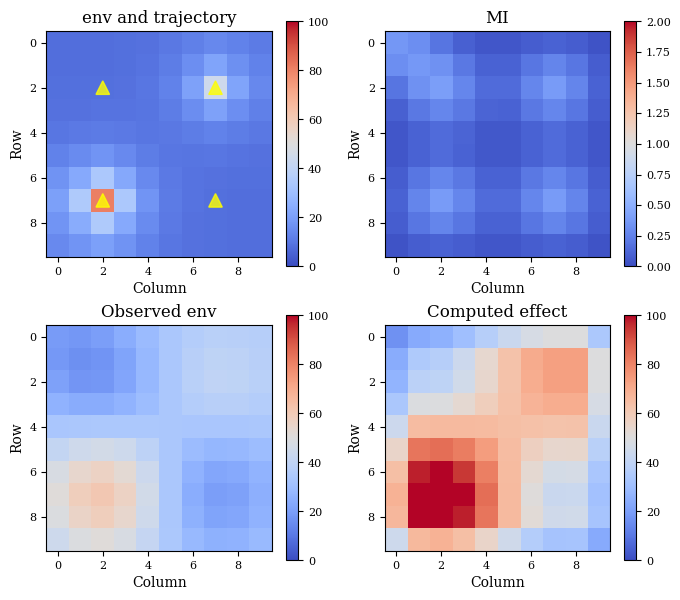

In [50]:
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors

arr = x_train.copy()

# Create two subplots for env_list and mi_list heatmaps
fig, axs = plt.subplots(2, 2, figsize=(8, 7))
ax1, ax2 = axs[0]
ax3, ax4 = axs[1]

ax1.set_title('env and trajectory')
ax1.set_xlabel('Column')
ax1.set_ylabel('Row')

ax2.set_title('MI')
ax2.set_xlabel('Column')
ax2.set_ylabel('Row')

ax3.set_title('Observed env')
ax3.set_xlabel('Column')
ax3.set_ylabel('Row')

ax4.set_title('Computed effect')
ax4.set_xlabel('Column')
ax4.set_ylabel('Row')

# Set axis limits for both subplots
ax1.axis([-0.5, 9.5, -0.5, 9.5])
ax2.axis([-0.5, 9.5, -0.5, 9.5])
ax3.axis([-0.5, 9.5, -0.5, 9.5])
ax4.axis([-0.5, 9.5, -0.5, 9.5])

# Invert y-axis for both subplots
ax1.invert_yaxis()
ax2.invert_yaxis()
ax3.invert_yaxis()
ax4.invert_yaxis()

# Create heatmap objects for both subplots
heatmap1 = env_list[0]
heatmap2 = mi_list[0]
heatmap3 = pred_list[0]
heatmap4 = sprinkeffect_list[0]

im1 = ax1.imshow(heatmap1, cmap=cm.coolwarm, interpolation='nearest', origin='lower')
im2 = ax2.imshow(heatmap2, cmap=cm.coolwarm, interpolation='nearest', origin='lower')
im3 = ax3.imshow(heatmap3, cmap=cm.coolwarm, interpolation='nearest', origin='lower')
im4 = ax4.imshow(heatmap4, cmap=cm.coolwarm, interpolation='nearest', origin='lower')

# Add colorbars to both subplots
cbar1 = fig.colorbar(im1, ax=ax1)
cbar2 = fig.colorbar(im2, ax=ax2)
cbar3 = fig.colorbar(im3, ax=ax3)
cbar4 = fig.colorbar(im4, ax=ax4)

# Plot the initial trajectory on the third subplot
l, = ax1.plot([],[], color='black', linewidth=1)

# Define the coordinates of the triangles
triangles = []
for i in range(x_station.shape[0]):
    triangles.append((x_station[i,0],x_station[i,1]))

# Define the size of the triangles
size = 0.3

# Plot each triangle using the fill function
for x, y in triangles:
    ax1.fill([y-size, y, y+size], [x+size, x-size, x+size], color='yellow', alpha=0.8)

# Define animate function for both subplots
def animate(i):
    heatmap1 = env_list[i]
    heatmap2 = mi_list[i]
    heatmap3 = pred_list[i]
    heatmap4 = sprinkeffect_list[i]
    
    im1.set_data(heatmap1)
    im2.set_data(heatmap2)
    im3.set_data(heatmap3)
    im4.set_data(heatmap4)
    
    # Adjust the color range of the heatmap
    im1.set_clim(vmin=0, vmax=100)
    im2.set_clim(vmin=0, vmax=2)
    im3.set_clim(vmin=0, vmax=100)
    im4.set_clim(vmin=0, vmax=100)
    
    # Extract the x-coordinates and y-coordinates up to time i
    x = arr[:i+1, 0]
    y = arr[:i+1, 1]
    # Update the trajectory with the current x and y coordinates
    l.set_data(y, x)

    return im1, im2, im3, im4, l

# Create animation object for both subplots
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=x_train.shape[0]-1)

filename = 'x_{}_y_{}_strategy_{}_env_{}_alpha_{}_{}_result.mp4'.format(grid_x, grid_y,Strategy,Env,alpha,adaptive)
ani.save(filename, writer='ffmpeg', fps=3)

# Display the animation
from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
from pypolo2.objectives.entropy import gaussian_entropy
from pypolo2.objectives.sprinkeffect import sprink_effect

candidate_states_list = []
last_state = x_train[-1,0:2]
for i in range(3):
    for j in range(3):
        c1 = last_state[0] -1 + i
        c2 = last_state[1] -1 + j
        if c1 < task_extent[0] or c1 > task_extent[1] or c2 < task_extent[2] or c2 > task_extent[3]:
            continue
        # if i == 1 and j == 1:
        #     continue
        candidate_states_list.append([c1, c2])
candidate_states = np.array(candidate_states_list)
#add demision
x, _ = model.get_data()
if x.shape[1] != candidate_states.shape[1]:
    model_input = np.zeros((candidate_states.shape[0],x.shape[1]))
    model_input[:,0:candidate_states.shape[1]] = candidate_states
    model_input[:,candidate_states.shape[1]:x.shape[1]] = model.time_stamp
else:
    model_input = candidate_states

print(model_input)
# first information object
# Evaluate candidates
prior_std, poste_std = model.prior_poste(model_input)

kernel.diag(model_input)

# print(poste_std)
# hprior = gaussian_entropy(prior_std.ravel())
# hposterior = gaussian_entropy(poste_std.ravel())
# mi = hprior - hposterior
# if np.any(mi < 0.0):
#     print(mi.ravel())
#     raise ValueError("Predictive MI < 0.0!")

# print(mi.shape)

# #second sprinkler effect
# allstate_list = []
# for i in range (task_extent[0],task_extent[1]+1):
#     for j in range (task_extent[2],task_extent[3]+1):
#         allstate_list.append([i, j, model.time_stamp])
# allstate = np.array(allstate_list)
# # print(allstate)
# mean, _ = model(allstate)
# print(mean[0])
# # print(model_input)
# sprinkeffect = sprink_effect(model_input,allstate,mean,task_extent).ravel()
# print(sprinkeffect)
# # Normalized scores
# # normed_mi = (mi - mi.min()) / mi.ptp()
# # normed_effect = (sprinkeffect - sprinkeffect.min()) / sprinkeffect.ptp()
# # # scores = normed_mi - normed_effect
# # scores = -normed_effect
# # # Append waypoint
# # sorted_indices = np.argsort(scores)
# # goal_states = candidate_states[sorted_indices[0:1]]
# # spray_flag = True

# # print(candidate_states[sorted_indices],sprinkeffect[sorted_indices])

[[0.e+00 0.e+00 1.e-04]
 [0.e+00 1.e+00 1.e-04]
 [1.e+00 0.e+00 1.e-04]
 [1.e+00 1.e+00 1.e-04]]


TypeError: 'int' object is not callable

In [ ]:
import numpy as np

def gaussian_kernel(x1, x2, l=1.0, sigma_f=1.0):
    """Easy to understand but inefficient."""
    m, n = x1.shape[0], x2.shape[0]
    dist_matrix = np.zeros((m, n), dtype=float)
    for i in range(m):
        for j in range(n):
            dist_matrix[i][j] = np.sum((x1[i] - x2[j]) ** 2)
    return sigma_f ** 2 * np.exp(- 0.5 / l ** 2 * dist_matrix)

def gaussian_kernel_vectorization(x1, x2, l=1.0, sigma_f=1.0):
    """More efficient approach."""
    dist_matrix = np.sum(x1**2, 1).reshape(-1, 1) + np.sum(x2**2, 1) - 2 * np.dot(x1, x2.T)
    return sigma_f ** 2 * np.exp(-0.5 / l ** 2 * dist_matrix)

x = np.array([700, 800, 1029]).reshape(-1, 1)
print(gaussian_kernel_vectorization(x, x, l=500, sigma_f=10))

[[100.          98.01986733  80.5347031 ]
 [ 98.01986733 100.          90.04307671]
 [ 80.5347031   90.04307671 100.        ]]


# Visualization

In [ ]:
from pypolo2.experiments import visualizer

In [ ]:
log = np.load(f"{save_dir}/log.npz")

In [ ]:
%matplotlib inline

In [ ]:
!pip install pyvirtualdisplay

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [ ]:
import pyvirtualdisplay

In [ ]:
d = pyvirtualdisplay.Display()
d.start() # Start Xvfb and set "DISPLAY" environment properly.

FileNotFoundError: [WinError 2] 系统找不到指定的文件。

In [ ]:
from matplotlib import pyplot as plt

In [ ]:
from IPython import display

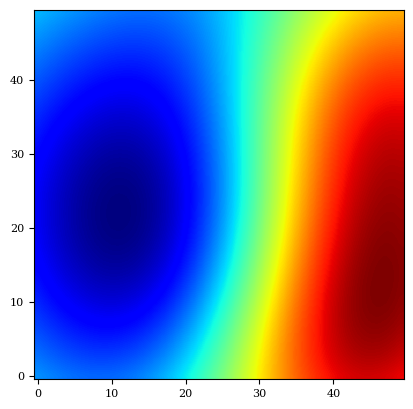

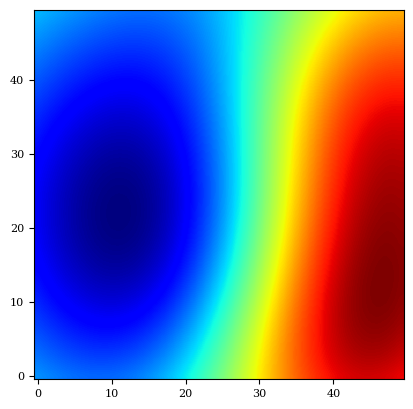

In [ ]:
display.clear_output(wait=True)
fig, ax = plt.subplots()
ax.imshow(mean.reshape(eval_grid))
display.display(plt.gcf())

In [ ]:
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
ax.axis([0,2*np.pi,-1,1])
l, = ax.plot([],[])

def animate(i):
    l.set_data(t[:i], x[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))

from IPython.display import HTML
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

fig = plt.figure();


def f(x, y):
    return np.sin(x) + np.cos(y)

x = np.linspace(0, 2 * np.pi, 120)
y = np.linspace(0, 2 * np.pi, 100).reshape(-1, 1)

im = plt.imshow(f(x, y), animated=True);


def updatefig(*args):
    global x, y
    x += np.pi / 15.
    y += np.pi / 20.
    im.set_array(f(x, y))
    return im,

ani = animation.FuncAnimation(fig, updatefig, interval=50, blit=True);



<IPython.core.display.Javascript object>

In [ ]:
HTML(ani.to_jshtml())